Name: Anisa Bintang Maharani

Student Id: 21/478671/TK/52746

> If my .ipynb file is too large to upload (13 MB), you can still view the outputs here:

Google Colab: https://colab.research.google.com/drive/194LdUrwK64fLywh1URgtXMUJ_c3Ob5Un?usp=sharing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install albumentations


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from PIL import Image
import os
import albumentations as A
from skimage.color import rgb2gray
from skimage.feature import local_binary_pattern
from albumentations.pytorch import ToTensorV2
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc
import matplotlib.pyplot as plt
import cv2
from sklearn.ensemble import RandomForestClassifier
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure


In [ ]:
import zipfile


# Skin lesion dataset
zip_path = '/content/drive/MyDrive/PROJECT_Data.zip'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/images')


In [ ]:
# # Skin hair dataset (I added)
# zip_path = '/content/drive/MyDrive/skin-hair-dataset-20240620T034722Z-001.zip'

# with zipfile.ZipFile(zip_path, 'r') as zip_ref:
#     zip_ref.extractall('/content/images')

In [ ]:
# Baca file CSV
csv_path = '/content/drive/MyDrive/ISIC_2017_Data_GroundTruth_Classification.csv'
df = pd.read_csv(csv_path)
df.head()

,image_id,melanoma,seborrheic_keratosis
0,ISIC_0000000,0.0,0.0
1,ISIC_0000001,0.0,0.0
2,ISIC_0000002,1.0,0.0
3,ISIC_0000003,0.0,0.0
4,ISIC_0000004,1.0,0.0


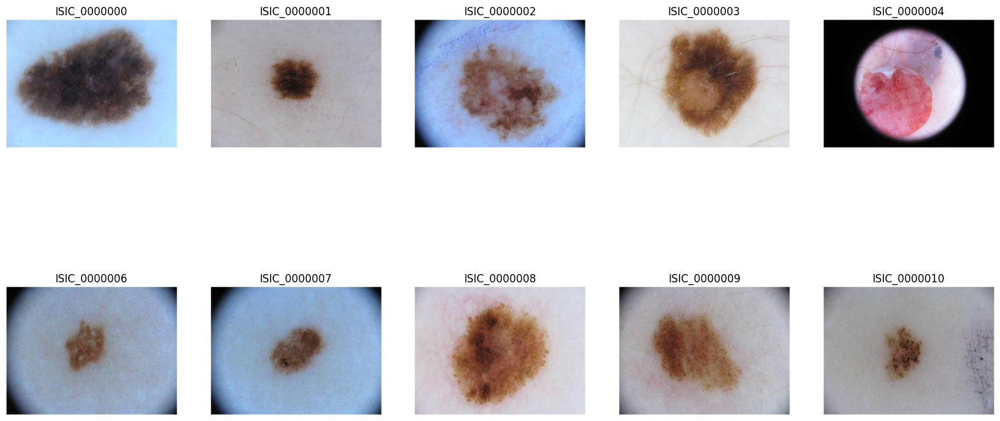

In [ ]:
import cv2
import matplotlib.pyplot as plt

def load_image(image_id, directory='/content/images/PROJECT_Data'):
    image_path = os.path.join(directory, f'{image_id}.jpg')
    image = cv2.imread(image_path)
    if image is None:
        image_path = os.path.join(directory, f'{image_id}.png')
        image = cv2.imread(image_path)
    return image

# Example image_ids from the dataset
image_ids = df['image_id'].tolist()[:10]  # Get the first 10 images to display

# Load images from the dataset
images = [load_image(image_id) for image_id in image_ids]

# Function to display images
def show_images(images, titles, num_images=10):
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        plt.subplot(2, num_images // 2, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

# Display some images from the dataset
image_titles = image_ids[:len(images)]
show_images(images, image_titles)


#Remove non-existing images from CSV

In [ ]:
def image_exists(image_id, directory='/content/images/PROJECT_Data'):
    jpg_path = os.path.join(directory, f'{image_id}.jpg')
    png_path = os.path.join(directory, f'{image_id}.png')
    return os.path.exists(jpg_path) or os.path.exists(png_path)


In [ ]:
# Filter the dataframe to keep only rows where the image exists
existing_images_df = df[df['image_id'].apply(image_exists)]

# Display the new dataframe
print(existing_images_df.head())
print(f"Original number of rows: {len(df)}")
print(f"Filtered number of rows: {len(existing_images_df)}")


       image_id  melanoma  seborrheic_keratosis
0  ISIC_0000000       0.0                   0.0
1  ISIC_0000001       0.0                   0.0
2  ISIC_0000002       1.0                   0.0
3  ISIC_0000003       0.0                   0.0
4  ISIC_0000004       1.0                   0.0
Original number of rows: 2000
Filtered number of rows: 200


In [ ]:
# Path to save the new CSV file
filtered_csv_path = '/content/drive/MyDrive/Filtered_ISIC_2017_Data_GroundTruth_Classification.csv'

# Save the filtered dataframe to a new CSV file
existing_images_df.to_csv(filtered_csv_path, index=False)


#Data Exploration

In [ ]:
def load_image(image_id, directory='/content/images/PROJECT_Data'):
    jpg_path = os.path.join(directory, f'{image_id}.jpg')
    png_path = os.path.join(directory, f'{image_id}.png')
    if os.path.exists(jpg_path):
        image = cv2.imread(jpg_path)
    elif os.path.exists(png_path):
        image = cv2.imread(png_path)
    else:
        image = None
    return image

In [ ]:
def show_images(images, titles, num_images=5):
    num_cols = min(num_images, 5)  # Set the number of columns to 5 or the number of images, whichever is smaller
    num_rows = (num_images + num_cols - 1) // num_cols  # Calculate the number of rows needed
    plt.figure(figsize=(20, 10))
    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()


In [ ]:
# Path to the CSV file in Google Drive
csv_path = '/content/drive/MyDrive/Filtered_ISIC_2017_Data_GroundTruth_Classification.csv'
df = pd.read_csv(csv_path)

# Get image IDs for each class
benign_image_ids = df[df['melanoma'] == 0]['image_id'].tolist()[:5]  # First 5 benign images
malignant_image_ids = df[df['melanoma'] == 1]['image_id'].tolist()[:5]  # First 5 malignant images

# Load images for each class
benign_images = [load_image(image_id) for image_id in benign_image_ids]
malignant_images = [load_image(image_id) for image_id in malignant_image_ids]


Benign Images:


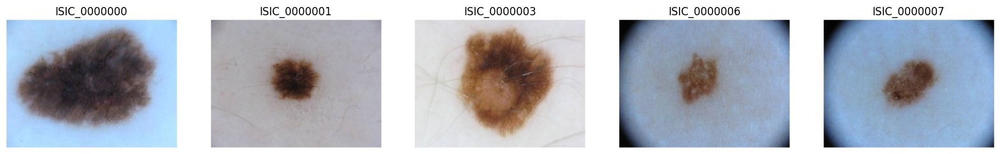

Malignant Images:


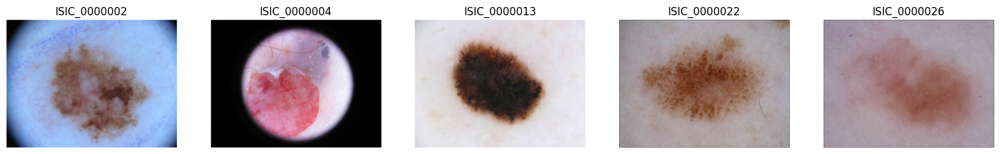

In [ ]:
# Display benign images
print("Benign Images:")
benign_titles = benign_image_ids[:len(benign_images)]
show_images(benign_images, benign_titles)

# Display malignant images
print("Malignant Images:")
malignant_titles = malignant_image_ids[:len(malignant_images)]
show_images(malignant_images, malignant_titles)

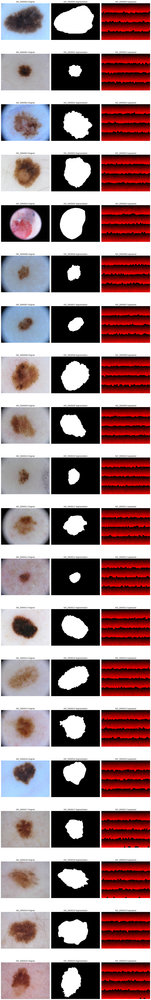

In [ ]:
# Function to check if the image file exists
def load_image(image_id, suffix='', directory='/content/images/PROJECT_Data'):
    image_path = os.path.join(directory, f'{image_id}{suffix}.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(directory, f'{image_id}{suffix}.png')
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
    else:
        image = None
    return image

# Get the first 20 image IDs
image_ids = df['image_id'].tolist()[:20]

# Load images, segmentation images, and superpixel images
original_images = [load_image(image_id) for image_id in image_ids]
segmentation_images = [load_image(image_id, '_segmentation') for image_id in image_ids]
superpixel_images = [load_image(image_id, '_superpixels') for image_id in image_ids]

# Function to display images
def show_images_grid(images1, images2, images3, titles, num_images=20):
    num_cols = 3  # Set the number of columns to 3
    num_rows = num_images  # Each image has its segmentation and superpixel versions, making up 3 columns
    plt.figure(figsize=(15, num_rows * 5))
    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i * num_cols + 1)
        if images1[i] is not None:
            plt.imshow(cv2.cvtColor(images1[i], cv2.COLOR_BGR2RGB))
        plt.title(f"{titles[i]} Original")
        plt.axis('off')

        plt.subplot(num_rows, num_cols, i * num_cols + 2)
        if images2[i] is not None:
            plt.imshow(cv2.cvtColor(images2[i], cv2.COLOR_BGR2RGB))
        plt.title(f"{titles[i]} Segmentation")
        plt.axis('off')

        plt.subplot(num_rows, num_cols, i * num_cols + 3)
        if images3[i] is not None:
            plt.imshow(cv2.cvtColor(images3[i], cv2.COLOR_BGR2RGB))
        plt.title(f"{titles[i]} Superpixel")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Display images with their segmentation and superpixel versions
show_images_grid(original_images, segmentation_images, superpixel_images, image_ids, num_images=len(original_images))

In [ ]:
def check_image_sizes(image_ids, directory='/content/images/PROJECT_Data'):
    for image_id in image_ids:
        original_image = load_image(image_id, directory=directory)
        segmentation_image = load_image(image_id, '_segmentation', directory=directory)
        superpixel_image = load_image(image_id, '_superpixels', directory=directory)

        if original_image is not None:
            print(f"Image ID: {image_id}")
            print(f"  Original Image Size: {original_image.shape}")
        if segmentation_image is not None:
            print(f"  Segmentation Image Size: {segmentation_image.shape}")
        if superpixel_image is not None:
            print(f"  Superpixel Image Size: {superpixel_image.shape}")

# Get a list of image IDs from the CSV
image_ids = df['image_id'].tolist()

# Check sizes of all images
check_image_sizes(image_ids)

Image ID: ISIC_0000000
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000001
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000002
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000003
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000004
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000006
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)
Image ID: ISIC_0000007
  Original Image Size: (767, 1022, 3)
  Segmentation Image Size: (767, 1022, 3)
  Superpixel Image Size: (767, 1022, 3)

#Preprocessing

### Workflow Summary:

1. **Calculate Average Size of Images:**
   - **Function:** `calculate_average_size`
   - **Purpose:** Computes the average width and height of the images.

2. **Resize All Images:**
   - **Function:** `resize_all_images`
   - **Purpose:** Resizes original, segmentation, and superpixel images to the average size.

3. **Display Resized Images:**
   - **Function:** `show_resized_images_grid`
   - **Purpose:** Visualizes the first 10 resized images in a grid format.

4. **Preprocess Image:**
   - **Function:** `preprocess_image`
   - **Purpose:** Applies Gaussian blur and CLAHE to enhance the image.

5. **Segment Lesion:**
   - **Function:** `segment_lesion`
   - **Purpose:** Converts the image to grayscale, applies adaptive thresholding, and finds contours to segment the lesion.

6. **Postprocess Segmentation Mask:**
   - **Function:** `postprocess_segmentation`
   - **Purpose:** Removes small connected components from the segmentation mask.

7. **Visualize Results:**
   - **Function:** `visualize_results`
   - **Purpose:** Displays the original image with contours and the final segmentation mask.

## Resize image



In [ ]:
import numpy as np

def calculate_average_size(image_ids, directory='/content/images/PROJECT_Data'):
    widths, heights = [], []

    for image_id in image_ids:
        original_image = load_image(image_id, directory=directory)
        if original_image is not None:
            heights.append(original_image.shape[0])
            widths.append(original_image.shape[1])

    avg_width = int(np.mean(widths))
    avg_height = int(np.mean(heights))

    print(f"Average width: {avg_width}, Average height: {avg_height}")
    return avg_width, avg_height

# Calculate the average size of the images
avg_width, avg_height = calculate_average_size(image_ids)

Average width: 1576, Average height: 1188


In [ ]:
def resize_image(image, size):
    return cv2.resize(image, size, interpolation=cv2.INTER_AREA)

def resize_all_images(image_ids, size, directory='/content/images/PROJECT_Data'):
    resized_original_images = []
    resized_segmentation_images = []
    resized_superpixel_images = []
    resized_image_ids = []

    for image_id in image_ids:
        original_image = load_image(image_id, directory=directory)
        segmentation_image = load_image(image_id, '_segmentation', directory=directory)
        superpixel_image = load_image(image_id, '_superpixels', directory=directory)

        if original_image is not None and segmentation_image is not None and superpixel_image is not None:
            resized_original_images.append(resize_image(original_image, size))
            resized_segmentation_images.append(resize_image(segmentation_image, size))
            resized_superpixel_images.append(resize_image(superpixel_image, size))
            resized_image_ids.append(image_id)

    return resized_original_images, resized_segmentation_images, resized_superpixel_images, resized_image_ids

In [ ]:
def show_resized_images_grid(images, titles, num_images=10, cols=3):
    plt.figure(figsize=(15, 15))
    for i in range(min(num_images, len(images))):
        plt.subplot((num_images // cols) + 1, cols, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()


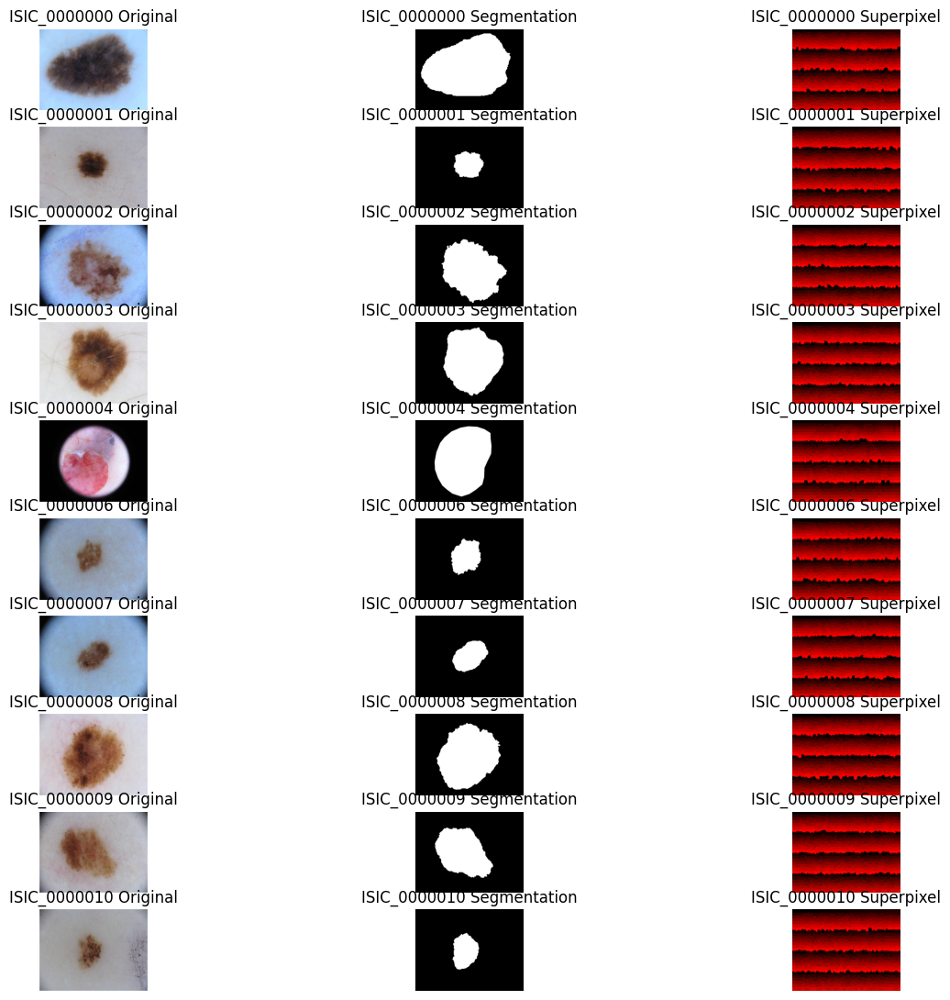

In [ ]:
# Resize all images to the average size
resized_original_images, resized_segmentation_images, resized_superpixel_images, resized_image_ids = resize_all_images(image_ids, (avg_width, avg_height))

# Prepare titles for the first 10 images
resized_titles = []
for i, image_id in enumerate(resized_image_ids[:10]):
    resized_titles.extend([f"{image_id} Original", f"{image_id} Segmentation", f"{image_id} Superpixel"])

# Combine images for the first 10 images
resized_images = []
for i in range(10):
    resized_images.extend([resized_original_images[i], resized_segmentation_images[i], resized_superpixel_images[i]])

# Display the first 10 resized images
show_resized_images_grid(resized_images, resized_titles, num_images=30, cols=3)

## Wrong Segmentation Problem



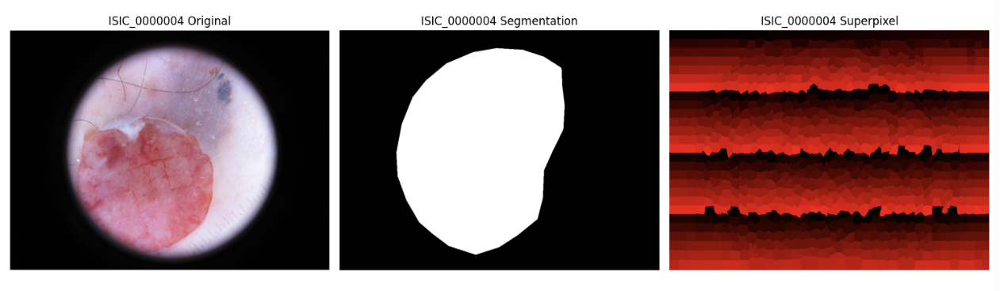


Try to apply some preprocessing methods

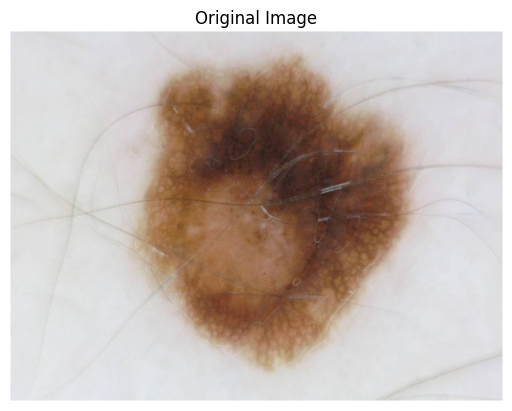

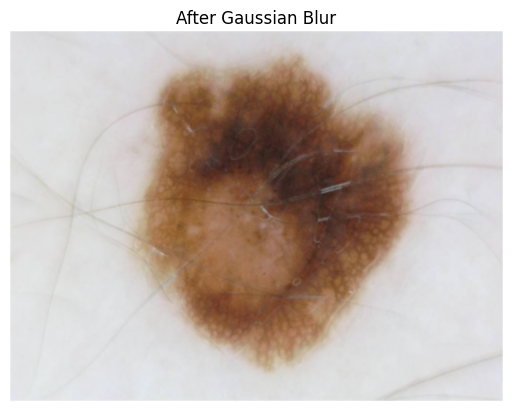

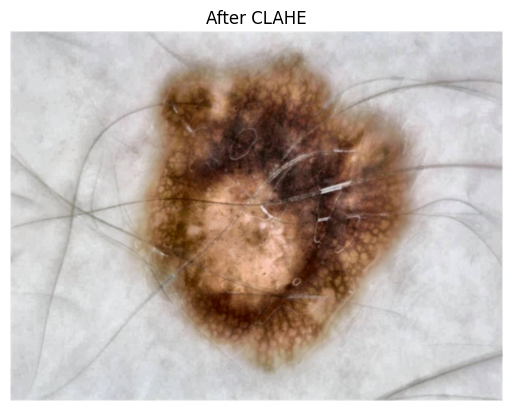

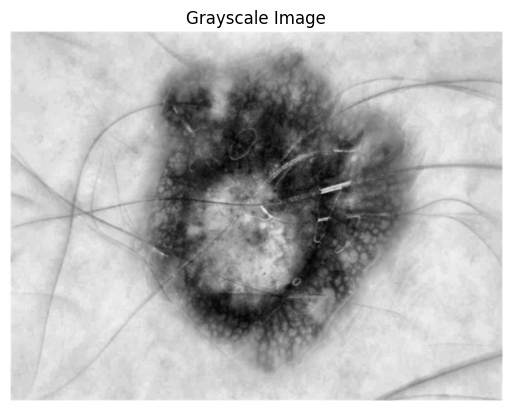

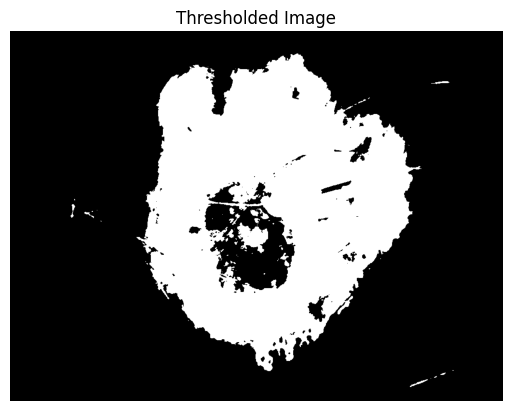

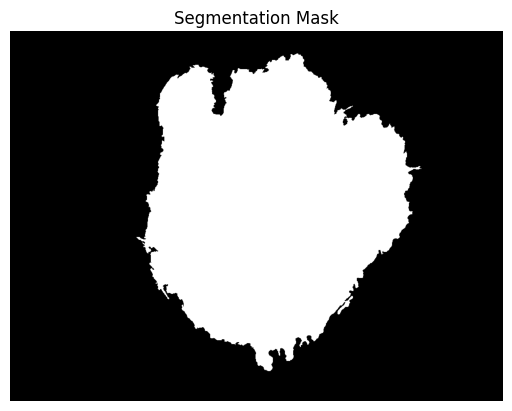

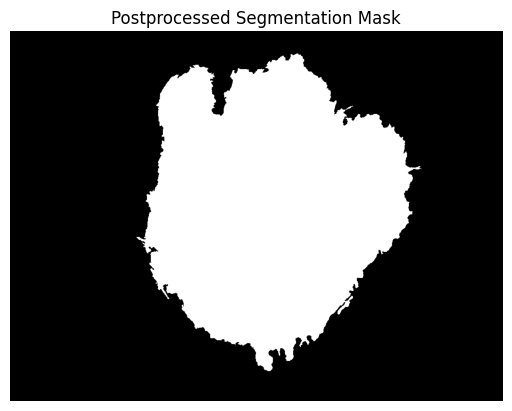

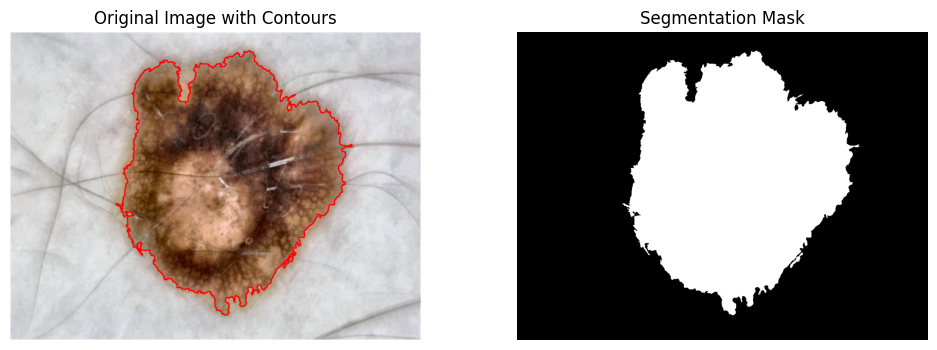

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

# Preprocessing function
def preprocess_image(image):
    # Display original image
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')
    plt.show()

    # Apply Gaussian blur to smooth the image
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    plt.title("After Gaussian Blur")
    plt.axis('off')
    plt.show()

    # Convert the image to LAB color space
    lab = cv2.cvtColor(blurred, cv2.COLOR_BGR2LAB)

    # Split the LAB image into L, A, and B channels
    l, a, b = cv2.split(lab)

    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)

    # Merge the CLAHE-enhanced L channel with the original A and B channels
    limg = cv2.merge((cl, a, b))

    # Convert the LAB image back to BGR color space
    result = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title("After CLAHE")
    plt.axis('off')
    plt.show()

    return result

# Segmentation function
def segment_lesion(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Display grayscale image
    plt.imshow(gray_image, cmap='gray')
    plt.title("Grayscale Image")
    plt.axis('off')
    plt.show()

    # Apply adaptive thresholding to segment the image
    _, thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Invert the thresholded image
    thresh = cv2.bitwise_not(thresh)

    plt.imshow(thresh, cmap='gray')
    plt.title("Thresholded Image")
    plt.axis('off')
    plt.show()

    # Find contours in the binary image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filter contours based on area to remove small noise
    min_contour_area = 100
    contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area]

    # Create an empty mask to draw the contours
    mask = np.zeros_like(thresh)

    # Draw the contours on the mask with a white color
    cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)

    plt.imshow(mask, cmap='gray')
    plt.title("Segmentation Mask")
    plt.axis('off')
    plt.show()

    return mask, contours

# Postprocessing function
def postprocess_segmentation(segmentation_mask):
    # Remove small connected components
    labeled_mask = measure.label(segmentation_mask, connectivity=2)
    for region in measure.regionprops(labeled_mask):
        if region.area < 100:
            segmentation_mask[labeled_mask == region.label] = 0

    plt.imshow(segmentation_mask, cmap='gray')
    plt.title("Postprocessed Segmentation Mask")
    plt.axis('off')
    plt.show()

    return segmentation_mask

# Visualization function
def visualize_results(original_image, segmentation_mask, contours):
    original_image_copy = original_image.copy()

    # Draw the contours on the original image
    cv2.drawContours(original_image_copy, contours, -1, (0, 0, 255), thickness=2)

    # Display the results using Matplotlib
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].imshow(cv2.cvtColor(original_image_copy, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Image with Contours')

    axes[1].imshow(segmentation_mask, cmap='gray')
    axes[1].set_title('Segmentation Mask')

    for ax in axes:
        ax.axis('off')

    plt.show()

# Example of applying the functions to a specific image
image_id = 'ISIC_0000003'
directory = '/content/images/PROJECT_Data'

# Load images
def load_image(image_id, suffix='', directory='/content/images/PROJECT_Data'):
    image_path = os.path.join(directory, f'{image_id}{suffix}.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(directory, f'{image_id}{suffix}.png')
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
    else:
        image = None
    return image

original_image = load_image(image_id, directory=directory)

# Preprocess the original image
preprocessed_image = preprocess_image(original_image)

# Segment the lesion
segmentation_mask, contours = segment_lesion(preprocessed_image)

# Postprocess the segmentation mask
postprocessed_mask = postprocess_segmentation(segmentation_mask)

# Visualize the results
visualize_results(preprocessed_image, postprocessed_mask, contours)


In [ ]:
# def process_all_images(image_ids, directory='/content/images/PROJECT_Data'):
#     processed_images = []
#     segmentation_masks = []
#     contours_list = []

#     for image_id in image_ids:
#         original_image = load_image(image_id, directory=directory)
#         if original_image is not None:
#             preprocessed_image = preprocess_image(original_image)
#             segmentation_mask, contours = segment_lesion(preprocessed_image)
#             postprocessed_mask = postprocess_segmentation(segmentation_mask)
#             processed_images.append(preprocessed_image)
#             segmentation_masks.append(postprocessed_mask)
#             contours_list.append(contours)

#     return processed_images, segmentation_masks, contours_list

In [ ]:
# def visualize_results_grid(contours, segmentation_masks, resized_superpixel_images, image_ids, num_images=5):
#     fig, axes = plt.subplots(num_images, 3, figsize=(15, num_images * 5))
#     for i in range(num_images):
#         # Plot Original Image with Contours
#         axes[i, 0].imshow(cv2.cvtColor(contours[i], cv2.COLOR_BGR2RGB))
#         axes[i, 0].set_title(f'{image_ids[i]} Original Image with Contours')
#         axes[i, 0].axis('off')

#         # Plot Segmentation Mask
#         axes[i, 1].imshow(segmentation_masks[i], cmap='gray')
#         axes[i, 1].set_title(f'{image_ids[i]} Segmentation (by myself)')
#         axes[i, 1].axis('off')

#         # Plot Superpixel Image
#         axes[i, 2].imshow(cv2.cvtColor(resized_superpixel_images[i], cv2.COLOR_BGR2RGB))
#         axes[i, 2].set_title(f'{image_ids[i]} Resized Superpixel')
#         axes[i, 2].axis('off')

#     plt.tight_layout()
#     plt.show()

# # Display 5 images
# visualize_results_grid(resized_original_images, resized_segmentation_images, resized_superpixel_images, image_ids, num_images=5)


In [ ]:
import cv2
import numpy as np
from skimage import measure

# Preprocessing function without visualization
def preprocess_image2(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    lab = cv2.cvtColor(blurred, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    result = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return result

# Segmentation function without visualization
def segment_lesion2(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    thresh = cv2.bitwise_not(thresh)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    min_contour_area = 100
    contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area]
    mask = np.zeros_like(thresh)
    cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)
    return mask, contours

# Postprocessing function without visualization
def postprocess_segmentation2(segmentation_mask):
    labeled_mask = measure.label(segmentation_mask, connectivity=2)
    for region in measure.regionprops(labeled_mask):
        if region.area < 100:
            segmentation_mask[labeled_mask == region.label] = 0
    return segmentation_mask


In [ ]:
def process_all_images2(image_ids, directory='/content/images/PROJECT_Data'):
    processed_images = []
    segmentation_masks = []
    contours_list = []

    for image_id in image_ids:
        original_image = load_image(image_id, directory=directory)
        if original_image is not None:
            preprocessed_image = preprocess_image2(original_image)
            segmentation_mask, contours = segment_lesion2(preprocessed_image)
            postprocessed_mask = postprocess_segmentation2(segmentation_mask)
            processed_images.append(preprocessed_image)
            segmentation_masks.append(postprocessed_mask)
            contours_list.append(contours)

    return processed_images, segmentation_masks, contours_list

# Load the image IDs from the CSV
csv_path = '/content/drive/MyDrive/ISIC_2017_Data_GroundTruth_Classification.csv'
df = pd.read_csv(csv_path)
image_ids = df['image_id'].values

# Apply preprocessing and segmentation to all images
processed_images, segmentation_masks, contours_list = process_all_images2(image_ids)


#Feature Extraction

### Feature Extraction Summary:

1. **Extract Geometrical Features:**
   - **Function:** `extract_geometrical_features`
   - **Purpose:** Computes area, perimeter, asymmetry, extent, and irregularity from the segmented image.

2. **Extract Intensity Features:**
   - **Function:** `extract_intensity_features`
   - **Purpose:** Computes the histogram of pixel intensities.

3. **Extract Texture Features:**
   - **Function:** `extract_texture_features`
   - **Purpose:** Computes Local Binary Pattern (LBP) histograms to describe texture.

4. **Extract Color Features:**
   - **Function:** `extract_color_features`
   - **Purpose:** Computes histograms of the hue, saturation, and value (HSV) color channels.

5. **Extract Shape Features:**
   - **Function:** `extract_shape_features`
   - **Purpose:** Computes compactness, extent, and aspect ratio of the largest contour.

6. **Extract GLCM Features:**
   - **Function:** `extract_glcm_features`
   - **Purpose:** Computes contrast, dissimilarity, homogeneity, energy, and correlation using Gray Level Co-occurrence Matrix (GLCM).

7. **Combine All Features:**
   - **Function:** `extract_combined_features`
   - **Purpose:** Aggregates geometrical, intensity, texture, color, shape, and GLCM features into a single feature vector.

In [ ]:
import cv2
import numpy as np
from skimage import measure, feature

def extract_geometrical_features(segmentation_mask):
    # Ensure the mask is binary
    segmentation_mask = (segmentation_mask > 0).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(segmentation_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return np.zeros(5)  # Return zero features if no contours found

    contour = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)
    moments = cv2.moments(contour)

    # Compute asymmetry
    (x, y, w, h) = cv2.boundingRect(contour)
    cropped_mask = segmentation_mask[y:y+h, x:x+w]
    if w % 2 != 0:
        w -= 1  # Ensure width is even
    left_half = cropped_mask[:, :w // 2]
    right_half = cropped_mask[:, w // 2:w]
    asymmetry = np.sum(left_half != right_half)

    # Compute extent (ratio of contour area to bounding box area)
    rect_area = w * h
    extent = float(area) / rect_area if rect_area > 0 else 0

    # Compute irregularity (ratio of perimeter squared to area)
    irregularity = (perimeter ** 2) / area if area > 0 else 0

    return np.array([area, perimeter, asymmetry, extent, irregularity])

# Example of loading and preprocessing a single image for debugging
def load_image(image_id, suffix='', directory='/content/images/PROJECT_Data'):
    image_path = os.path.join(directory, f'{image_id}{suffix}.jpg')
    if not os.path.exists(image_path):
        image_path = os.path.join(directory, f'{image_id}{suffix}.png')
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
    else:
        image = None
    return image

def preprocess_image2(image):
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    lab = cv2.cvtColor(blurred, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    result = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return result

def segment_lesion2(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    thresh = cv2.bitwise_not(thresh)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    min_contour_area = 100
    contours = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area]
    mask = np.zeros_like(thresh)
    cv2.drawContours(mask, contours, -1, 255, thickness=cv2.FILLED)
    return mask, contours

def postprocess_segmentation2(segmentation_mask):
    labeled_mask = measure.label(segmentation_mask, connectivity=2)
    for region in measure.regionprops(labeled_mask):
        if region.area < 100:
            segmentation_mask[labeled_mask == region.label] = 0
    return segmentation_mask

# Test the feature extraction for a single image
image_id = 'ISIC_0000003'
original_image = load_image(image_id)
preprocessed_image = preprocess_image2(original_image)
segmentation_mask, contours = segment_lesion2(preprocessed_image)
postprocessed_mask = postprocess_segmentation2(segmentation_mask)
features = extract_geometrical_features(postprocessed_mask)
print(f"Extracted features for {image_id}: {features}")


Extracted features for ISIC_0000003: [2.44767500e+05 3.59680349e+03 8.52150000e+04 6.29529847e-01
 5.28542203e+01]


In [ ]:
def extract_intensity_features(image):
    # Compute histogram
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])
    hist = cv2.normalize(hist, hist).flatten()

    return hist

def extract_texture_features(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lbp = feature.local_binary_pattern(gray_image, P=8, R=1, method='uniform')
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 10), range=(0, 10))
    lbp_hist = lbp_hist.astype("float")
    lbp_hist /= (lbp_hist.sum() + 1e-6)

    return lbp_hist


In [ ]:
def extract_combined_features(preprocessed_image, segmentation_mask, superpixel_image):
    geom_features = extract_geometrical_features(segmentation_mask)
    intensity_features_orig = extract_intensity_features(preprocessed_image)
    texture_features_orig = extract_texture_features(preprocessed_image)
    intensity_features_super = extract_intensity_features(superpixel_image)
    texture_features_super = extract_texture_features(superpixel_image)

    return np.hstack((geom_features, intensity_features_orig, texture_features_orig, intensity_features_super, texture_features_super))


In [ ]:
def extract_color_features(image):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist_h = cv2.calcHist([hsv_image], [0], None, [256], [0, 256])
    hist_s = cv2.calcHist([hsv_image], [1], None, [256], [0, 256])
    hist_v = cv2.calcHist([hsv_image], [2], None, [256], [0, 256])

    hist_h = cv2.normalize(hist_h, hist_h).flatten()
    hist_s = cv2.normalize(hist_s, hist_s).flatten()
    hist_v = cv2.normalize(hist_v, hist_v).flatten()

    return np.hstack((hist_h, hist_s, hist_v))


In [ ]:
def extract_shape_features(contours):
    if not contours:
        return np.zeros(3)  # Return zero features if no contours found

    contour = max(contours, key=cv2.contourArea)
    area = cv2.contourArea(contour)
    perimeter = cv2.arcLength(contour, True)

    # Calculate compactness
    compactness = (perimeter ** 2) / (4 * np.pi * area) if area > 0 else 0

    # Calculate extent
    (x, y, w, h) = cv2.boundingRect(contour)
    rect_area = w * h
    extent = float(area) / rect_area if rect_area > 0 else 0

    # Calculate aspect ratio
    aspect_ratio = float(w) / h if h > 0 else 0

    return np.array([compactness, extent, aspect_ratio])


In [ ]:
def extract_glcm_features(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    glcm = feature.graycomatrix(gray_image, [1], [0], symmetric=True, normed=True)
    contrast = feature.graycoprops(glcm, 'contrast')[0, 0]
    dissimilarity = feature.graycoprops(glcm, 'dissimilarity')[0, 0]
    homogeneity = feature.graycoprops(glcm, 'homogeneity')[0, 0]
    energy = feature.graycoprops(glcm, 'energy')[0, 0]
    correlation = feature.graycoprops(glcm, 'correlation')[0, 0]

    return np.array([contrast, dissimilarity, homogeneity, energy, correlation])


In [ ]:
def extract_combined_features(preprocessed_image, segmentation_mask, superpixel_image):
    # Extract geometrical features
    geom_features = extract_geometrical_features(segmentation_mask)

    # Extract intensity features
    intensity_features_orig = extract_intensity_features(preprocessed_image)
    intensity_features_super = extract_intensity_features(superpixel_image)

    # Extract texture features
    texture_features_orig = extract_texture_features(preprocessed_image)
    texture_features_super = extract_texture_features(superpixel_image)

    # Extract color features
    color_features_orig = extract_color_features(preprocessed_image)
    color_features_super = extract_color_features(superpixel_image)

    # Extract shape features
    contours, _ = cv2.findContours(segmentation_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    shape_features = extract_shape_features(contours)

    # Extract additional texture features
    glcm_features_orig = extract_glcm_features(preprocessed_image)
    glcm_features_super = extract_glcm_features(superpixel_image)

    # Combine all features into a single feature vector
    return np.hstack((
        geom_features,
        intensity_features_orig, intensity_features_super,
        texture_features_orig, texture_features_super,
        color_features_orig, color_features_super,
        shape_features,
        glcm_features_orig, glcm_features_super
    ))


In [ ]:
# import pandas as pd

# # Function to save features to a CSV file
# def save_features_to_csv(features, image_ids, output_csv):
#     columns = [
#         'area', 'perimeter', 'asymmetry', 'extent', 'irregularity',
#         'compactness', 'extent_shape', 'aspect_ratio',
#         'contrast_orig', 'dissimilarity_orig', 'homogeneity_orig', 'energy_orig', 'correlation_orig',
#         'contrast_super', 'dissimilarity_super', 'homogeneity_super', 'energy_super', 'correlation_super'
#     ]

#     # Add columns for intensity, texture, and color features
#     for i in range(256):  # Assuming 256 bins for histograms
#         columns.append(f'intensity_hist_orig_{i}')
#         columns.append(f'intensity_hist_super_{i}')
#     for i in range(9):  # Assuming 9 bins for LBP
#         columns.append(f'lbp_hist_orig_{i}')
#         columns.append(f'lbp_hist_super_{i}')
#     for i in range(256):
#         columns.append(f'color_hist_h_orig_{i}')
#         columns.append(f'color_hist_s_orig_{i}')
#         columns.append(f'color_hist_v_orig_{i}')
#         columns.append(f'color_hist_h_super_{i}')
#         columns.append(f'color_hist_s_super_{i}')
#         columns.append(f'color_hist_v_super_{i}')

#     # df = pd.DataFrame(features, columns=columns)
#     df['image_id'] = image_ids
#     df = df[['image_id'] + columns]  # Ensure image_id is the first column
#     df.to_csv(output_csv, index=False)

# # Function to extract features from all images
# def extract_features_from_all_images(image_ids, directory='/content/images/PROJECT_Data'):
#     features = []
#     valid_image_ids = []

#     for image_id in image_ids:
#         original_image = load_image(image_id, directory=directory)
#         if original_image is not None:
#             preprocessed_image = preprocess_image2(original_image)
#             segmentation_mask, contours = segment_lesion2(preprocessed_image)
#             postprocessed_mask = postprocess_segmentation2(segmentation_mask)
#             superpixel_image = load_image(image_id, '_superpixels', directory=directory)
#             if superpixel_image is not None:
#                 superpixel_image_resized = resize_image(superpixel_image, avg_width, avg_height)
#                 combined_features = extract_combined_features(preprocessed_image, postprocessed_mask, superpixel_image_resized)
#                 features.append(combined_features)
#                 valid_image_ids.append(image_id)

#     return np.array(features), valid_image_ids

# # Example usage
# # Assuming you have defined the functions preprocess_image2, segment_lesion2, postprocess_segmentation2, load_image, resize_image, extract_combined_features

# # Ekstraksi fitur dari semua gambar
# # image_ids = ['ISIC_0000000', 'ISIC_0000001', 'ISIC_0000002']  # Contoh image_ids, ganti dengan yang sebenarnya
# image_ids = df[['image_id']]
# features, valid_image_ids = extract_features_from_all_images(image_ids)

# # Save features to CSV
# output_csv_path = '/content/drive/MyDrive/features.csv'
# save_features_to_csv(features, valid_image_ids, output_csv_path)
# print(f"Fitur berhasil disimpan ke {output_csv_path}.")


In [ ]:
# Load the CSV files
features_df = pd.read_csv('/content/drive/MyDrive/extracted_features.csv')
groundtruth_df = pd.read_csv('/content/drive/MyDrive/Filtered_ISIC_2017_Data_GroundTruth_Classification.csv')



In [ ]:
# Since there's no common column to merge on and the rows are in order, we can concatenate them
# Combine the dataframes
merged_df = pd.concat([groundtruth_df, features_df], axis=1)
# Save the merged dataframe to a new CSV file
output_csv_path = '/content/drive/MyDrive/new_skinlesion.csv'
merged_df.to_csv(output_csv_path, index=False)

print(f"Merged CSV saved to {output_csv_path}.")

Merged CSV saved to /content/drive/MyDrive/new_skinlesion.csv.


# Modelling


## Looking for top features

I have trouble when joining file using python. So, I do it manually, here is the link to file:

https://drive.google.com/file/d/1zjmoZzVLYXodEb4PzYm5Y6sZ1x0PL2yT/view?usp=sharing

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load the merged dataset
merged_csv_path = '/content/drive/MyDrive/combined_features_groundtruth.csv'
merged_df = pd.read_csv(merged_csv_path)

# Display the first 10 rows of the dataframe
merged_df.head(10)


,image_id,melanoma,seborrheic_keratosis,area,perimeter,asymmetry,extent,irregularity,compactness,extent_shape,...,color_hist_h_super_254,color_hist_s_super_254,color_hist_v_super_254,color_hist_h_orig_255,color_hist_s_orig_255,color_hist_v_orig_255,color_hist_h_super_255,color_hist_s_super_255,color_hist_v_super_255,image_id.1
0,ISIC_0000000,0.0,0.0,328284.0,3866.893894,106466.0,0.659102,45.548575,0.000000,0.000000,...,1.889456,0.523261,0.055694,0.998565,3.449026,0.256859,0.948281,0.107407,0.996337,ISIC_0000000
1,ISIC_0000001,0.0,0.0,48904.5,1633.113906,24062.0,0.602688,54.536107,0.001610,0.001459,...,1.611781,0.628708,0.094784,0.993671,3.215673,0.248721,0.948553,0.107823,0.996499,ISIC_0000001
2,ISIC_0000002,1.0,0.0,153960.5,5999.536800,71286.0,0.436530,233.790107,0.012484,0.000973,...,2.642760,0.410057,0.032324,0.996106,3.319435,0.260879,0.946412,0.107510,0.996415,ISIC_0000002
3,ISIC_0000003,0.0,0.0,244767.5,3596.803493,85215.0,0.629530,52.854220,0.063931,0.004189,...,1.798333,0.570573,0.074279,0.998504,3.342684,0.258629,0.947011,0.107410,0.996393,ISIC_0000003
4,ISIC_0000004,1.0,0.0,777784.5,3565.213203,727.0,0.996776,16.342245,0.003266,0.000314,...,1.893593,0.642374,0.241335,0.998352,3.049489,0.218730,0.956888,0.108744,0.996715,ISIC_0000004
5,ISIC_0000006,0.0,0.0,50696.5,2585.633678,40080.0,0.295848,131.873039,0.009172,0.001089,...,3.176196,0.362962,0.038632,0.990321,3.894423,0.286079,0.943819,0.106932,0.995872,ISIC_0000006
6,ISIC_0000007,0.0,0.0,50609.0,2126.199254,30616.0,0.529294,89.326469,0.004340,0.000375,...,2.558964,0.432812,0.045776,0.993342,3.433329,0.261242,0.946979,0.107528,0.996290,ISIC_0000007
7,ISIC_0000008,0.0,0.0,219109.0,4369.084798,89737.0,0.597353,87.120575,0.100996,0.006450,...,1.916472,0.533494,0.064220,0.997964,3.457328,0.266345,0.946184,0.107344,0.996216,ISIC_0000008
8,ISIC_0000009,0.0,0.0,142445.5,4810.028010,67286.0,0.553659,162.422607,0.027116,0.001830,...,2.494634,0.445138,0.043646,0.993934,3.032232,0.257137,0.945352,0.107220,0.996772,ISIC_0000009
9,ISIC_0000010,0.0,0.0,36587.5,1566.202219,21008.0,0.499911,67.044466,0.023594,0.001098,...,2.208319,0.530648,0.077504,0.987339,3.471522,0.270761,0.944832,0.107073,0.996256,ISIC_0000010


In [ ]:
merged_df.dtypes

image_id                   object
melanoma                  float64
seborrheic_keratosis      float64
area                      float64
perimeter                 float64
                           ...   
color_hist_v_orig_255     float64
color_hist_h_super_255    float64
color_hist_s_super_255    float64
color_hist_v_super_255    float64
image_id.1                 object
Length: 2088, dtype: object

In [ ]:
# Drop non-numeric columns
numeric_df = merged_df.drop(columns=['image_id', 'image_id.1','seborrheic_keratosis'])

# Compute the correlation matrix
corr_matrix = numeric_df.corr()

# Extract the correlation of all features with the target 'melanoma'
target_corr = corr_matrix['melanoma'].drop(labels=['melanoma'])

# Display the correlations
print(target_corr)

area                     -0.182907
perimeter                 0.182652
asymmetry                 0.170449
extent                   -0.256198
irregularity              0.276379
                            ...   
color_hist_s_orig_255    -0.231566
color_hist_v_orig_255    -0.161794
color_hist_h_super_255   -0.263196
color_hist_s_super_255   -0.248224
color_hist_v_super_255    0.216331
Name: melanoma, Length: 2084, dtype: float64


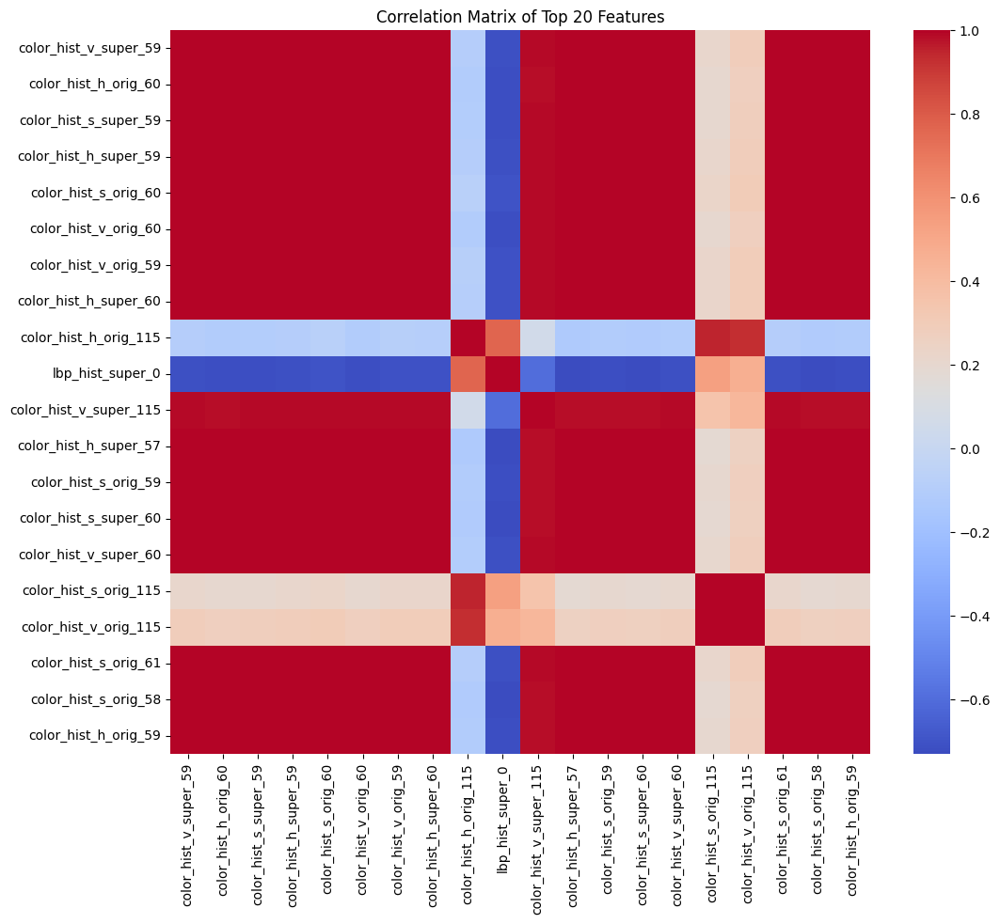

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
top_features = target_corr.abs().sort_values(ascending=False).head(20).index
# Plot the correlation matrix for top features
plt.figure(figsize=(12, 10))
sns.heatmap(X[top_features].corr(), annot=False, cmap='coolwarm')
plt.title('Correlation Matrix of Top 20 Features')
plt.show()


In [ ]:
top_features

Index(['color_hist_v_super_59', 'color_hist_h_orig_60',
       'color_hist_s_super_59', 'color_hist_h_super_59',
       'color_hist_s_orig_60', 'color_hist_v_orig_60', 'color_hist_v_orig_59',
       'color_hist_h_super_60', 'color_hist_h_orig_115', 'lbp_hist_super_0',
       'color_hist_v_super_115', 'color_hist_h_super_57',
       'color_hist_s_orig_59', 'color_hist_s_super_60',
       'color_hist_v_super_60', 'color_hist_s_orig_115',
       'color_hist_v_orig_115', 'color_hist_s_orig_61', 'color_hist_s_orig_58',
       'color_hist_h_orig_59'],
      dtype='object')

## Splitting data

In [ ]:
!pip install tensorflow

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc, f1_score, precision_recall_curve
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

import xgboost as xgb
import lightgbm as lgb

In [ ]:
# Split the dataset into features and target
X = numeric_df.drop(columns=['melanoma'])
y = numeric_df['melanoma']

# Standardize the features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split the data into training and testing sets with stratification
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
# Print number of samples in train and test sets
print(f"Number of training samples: {len(X_train)}")
print(f"Number of test samples: {len(X_test)}")

Number of training samples: 160
Number of test samples: 40


In [ ]:
print(X_train[:5])

[[ 1.39250701 -0.43874064 -0.70534605 ...  0.38324431 -0.10323191
  -0.01201152]
 [-0.96606949  0.60860325 -0.28047901 ... -2.22264865 -1.93261567
   1.54530778]
 [-0.56836087  0.17800047  0.4612729  ...  0.1999068   0.54953843
  -1.10974859]
 [-0.94803811 -0.33785367 -0.41173708 ... -0.73812151 -0.3519691
   1.01847397]
 [-0.51971827  0.23788799  0.04514871 ... -0.93161082 -0.6521303
   0.87361427]]


## Train and Test using All Features

In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Benign', 'Melanoma'], yticklabels=['Benign', 'Melanoma'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Function to plot ROC curve
def plot_roc_curve(y_true, y_pred_prob, title):
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc="lower right")
    plt.show()


Logistic Regression Results (Full Feature Set)
Confusion Matrix:
[[19  1]
 [ 8 12]]
Accuracy: 0.78
F1 Score: 0.73
AUC-ROC: 0.85
Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.95      0.81        20
         1.0       0.92      0.60      0.73        20

    accuracy                           0.78        40
   macro avg       0.81      0.77      0.77        40
weighted avg       0.81      0.78      0.77        40



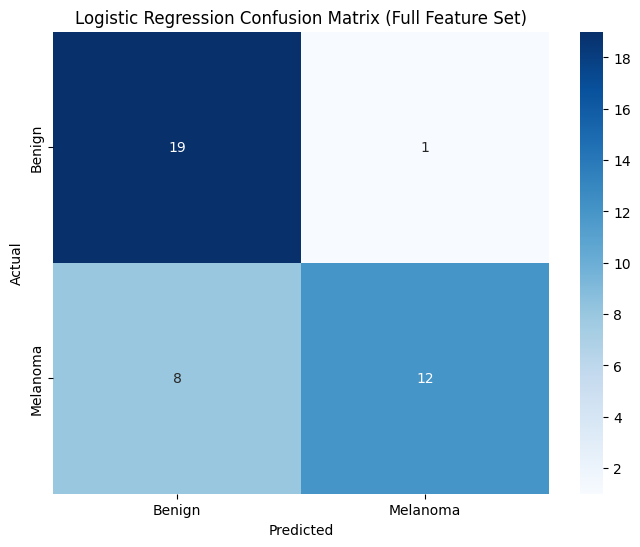

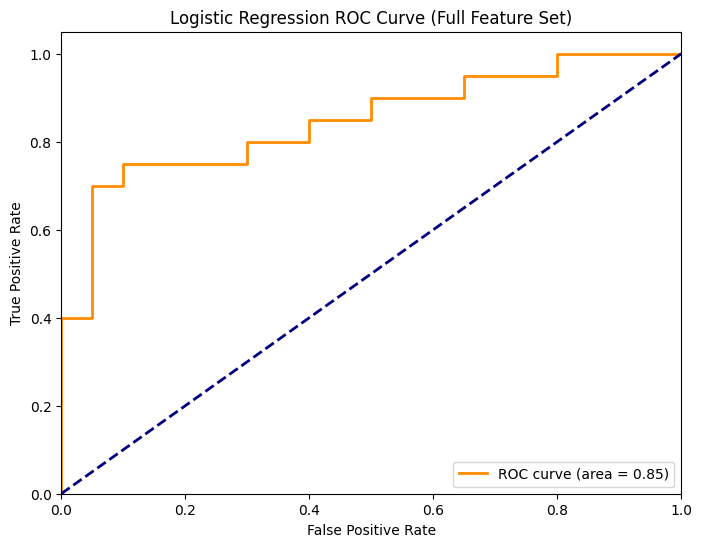


Random Forest Results (Full Feature Set)
Confusion Matrix:
[[16  4]
 [ 7 13]]
Accuracy: 0.72
F1 Score: 0.70
AUC-ROC: 0.78
Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.80      0.74        20
         1.0       0.76      0.65      0.70        20

    accuracy                           0.73        40
   macro avg       0.73      0.73      0.72        40
weighted avg       0.73      0.72      0.72        40



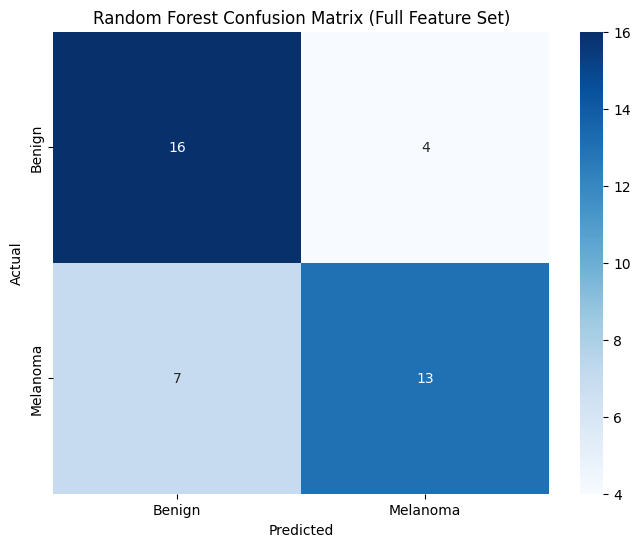

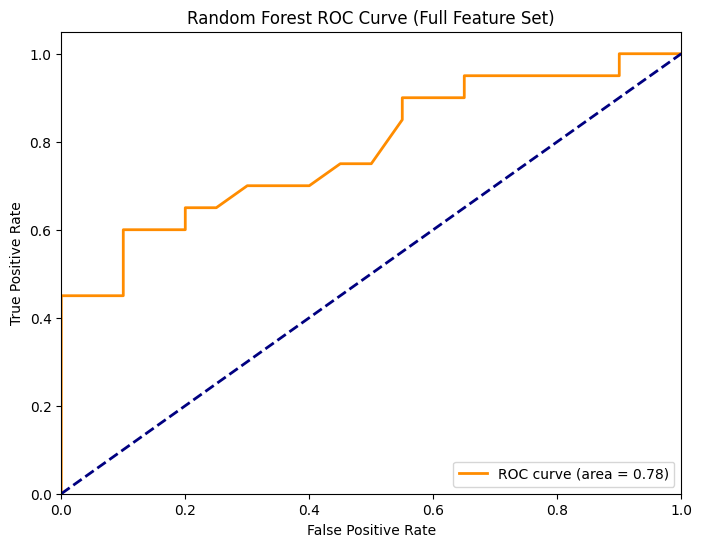


Support Vector Machine Results (Full Feature Set)
Confusion Matrix:
[[19  1]
 [ 9 11]]
Accuracy: 0.75
F1 Score: 0.69
AUC-ROC: 0.82
Classification Report:
              precision    recall  f1-score   support

         0.0       0.68      0.95      0.79        20
         1.0       0.92      0.55      0.69        20

    accuracy                           0.75        40
   macro avg       0.80      0.75      0.74        40
weighted avg       0.80      0.75      0.74        40



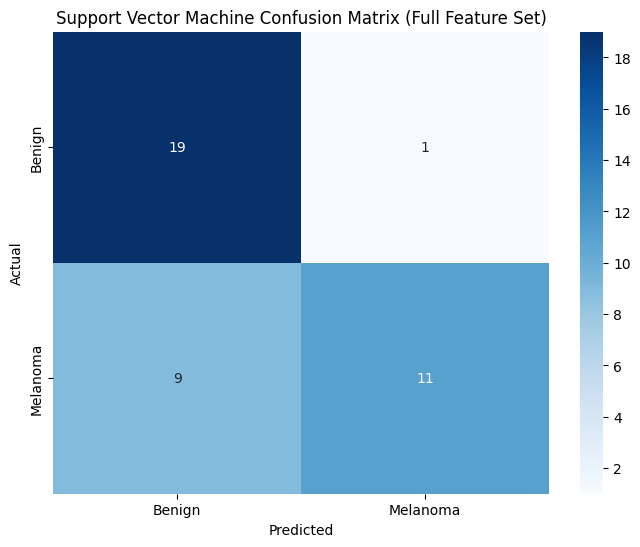

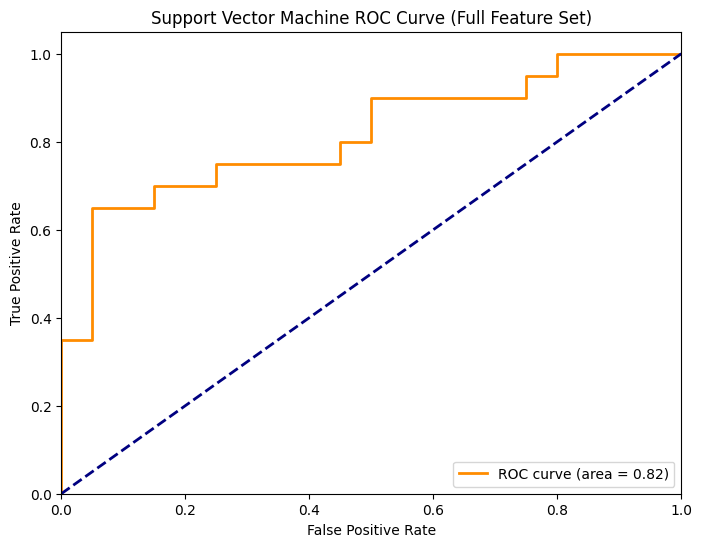


XGBoost Results (Full Feature Set)
Confusion Matrix:
[[14  6]
 [ 6 14]]
Accuracy: 0.70
F1 Score: 0.70
AUC-ROC: 0.77
Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.70      0.70        20
         1.0       0.70      0.70      0.70        20

    accuracy                           0.70        40
   macro avg       0.70      0.70      0.70        40
weighted avg       0.70      0.70      0.70        40



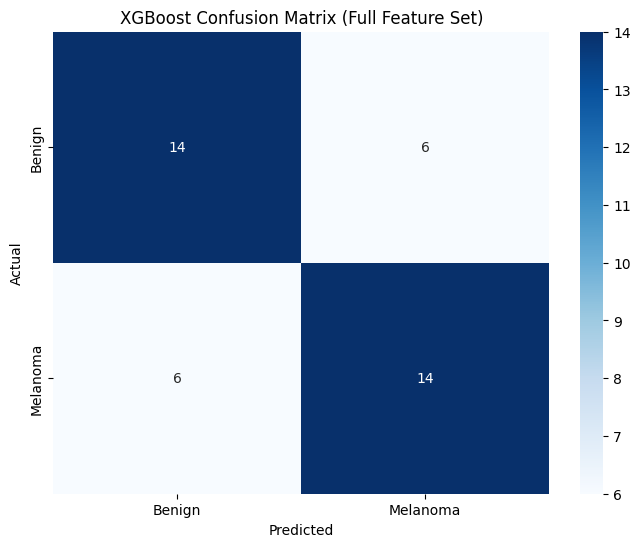

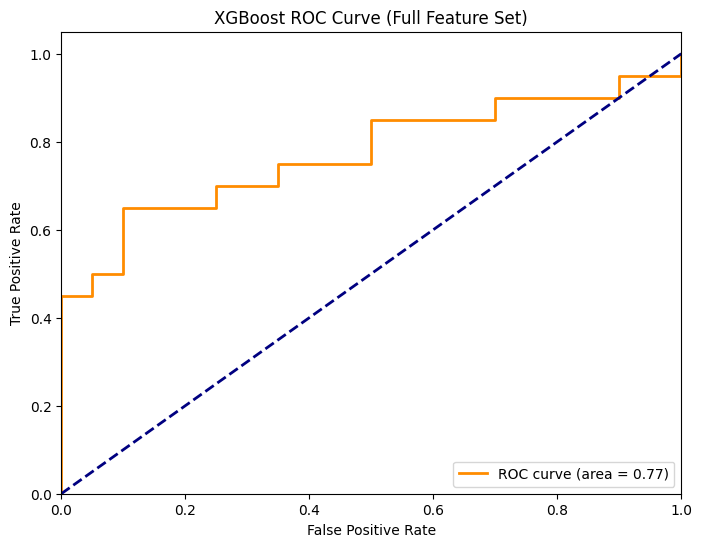

[LightGBM] [Info] Number of positive: 80, number of negative: 80
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 62359
[LightGBM] [Info] Number of data points in the train set: 160, number of used features: 1240
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

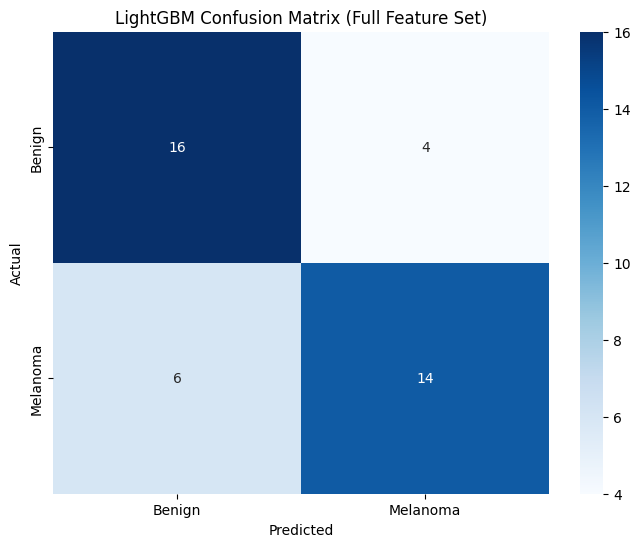

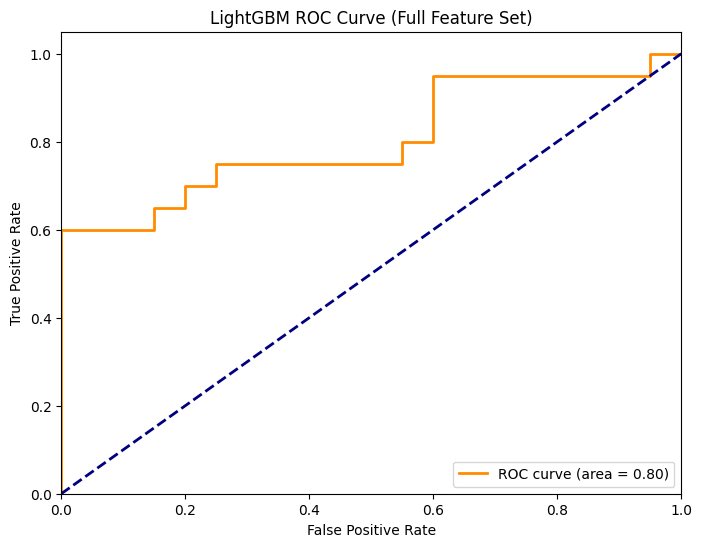

Epoch 1/300
4/4 [==============================] - 2s 95ms/step - loss: 4.2280 - accuracy: 0.5469 - val_loss: 3.8565 - val_accuracy: 0.5938
Epoch 2/300
4/4 [==============================] - 0s 24ms/step - loss: 3.6941 - accuracy: 0.6719 - val_loss: 3.5102 - val_accuracy: 0.6250
Epoch 3/300
4/4 [==============================] - 0s 25ms/step - loss: 3.3337 - accuracy: 0.6875 - val_loss: 3.2925 - val_accuracy: 0.5938
Epoch 4/300
4/4 [==============================] - 0s 26ms/step - loss: 3.1752 - accuracy: 0.7031 - val_loss: 3.1703 - val_accuracy: 0.6562
Epoch 5/300
4/4 [==============================] - 0s 27ms/step - loss: 2.9765 - accuracy: 0.7734 - val_loss: 3.0622 - val_accuracy: 0.6562
Epoch 6/300
4/4 [==============================] - 0s 22ms/step - loss: 2.7313 - accuracy: 0.8281 - val_loss: 2.9804 - val_accuracy: 0.6562
Epoch 7/300
4/4 [==============================] - 0s 25ms/step - loss: 2.5844 - accuracy: 0.8594 - val_loss: 2.9198 - val_accuracy: 0.6250
Epoch 8/300
4/4 [===

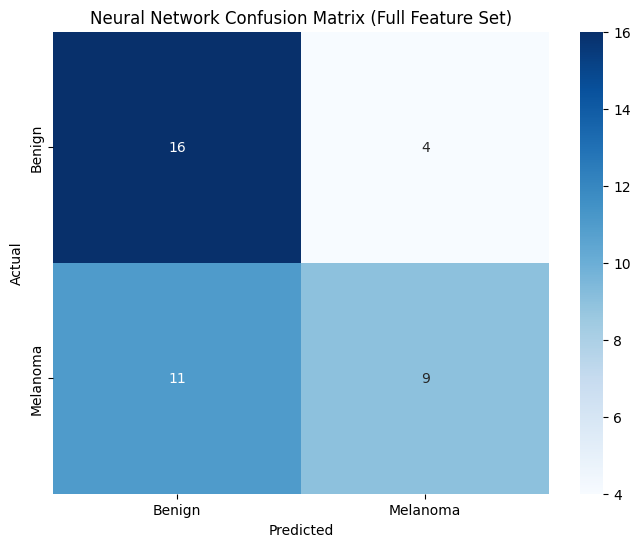

2/2 [==============================] - 0s 5ms/step


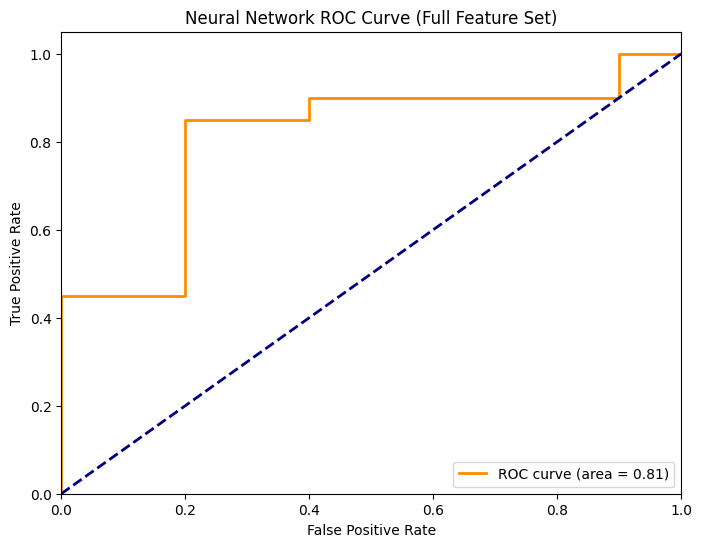

In [ ]:
# Split the dataset into features and target using the full feature set
X_full = numeric_df.drop(columns=['melanoma'])
y_full = numeric_df['melanoma']

# Standardize the features
scaler = StandardScaler()
X_full = scaler.fit_transform(X_full)

# Split the data into training and testing sets with stratification
X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(X_full, y_full, test_size=0.2, random_state=42, stratify=y_full)

results_full = []

for name, clf in classifiers.items():
    clf.fit(X_train_full, y_train_full)
    y_pred = clf.predict(X_test_full)
    y_pred_prob = clf.predict_proba(X_test_full)[:, 1] if hasattr(clf, "predict_proba") else None
    accuracy = accuracy_score(y_test_full, y_pred)
    f1 = f1_score(y_test_full, y_pred)
    roc_auc = auc(*roc_curve(y_test_full, y_pred_prob)[:2]) if y_pred_prob is not None else None
    results_full.append({
        'Model': name,
        'Accuracy': accuracy,
        'F1 Score': f1,
        'AUC-ROC': roc_auc,
        'Precision': classification_report(y_test_full, y_pred, output_dict=True)['weighted avg']['precision'],
        'Recall': classification_report(y_test_full, y_pred, output_dict=True)['weighted avg']['recall']
    })
    print(f'\n{name} Results (Full Feature Set)')
    print('Confusion Matrix:')
    print(confusion_matrix(y_test_full, y_pred))
    print(f'Accuracy: {accuracy:.2f}')
    print(f'F1 Score: {f1:.2f}')
    print(f'AUC-ROC: {roc_auc:.2f}' if roc_auc is not None else 'AUC-ROC: N/A')
    print('Classification Report:')
    print(classification_report(y_test_full, y_pred))
    plot_confusion_matrix(y_test_full, y_pred, title=f'{name} Confusion Matrix (Full Feature Set)')
    if y_pred_prob is not None:
        plot_roc_curve(y_test_full, y_pred_prob, title=f'{name} ROC Curve (Full Feature Set)')

# Define a neural network model for the full feature set
def create_model(input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_dim=input_dim, kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    return model

# Create and compile the model
input_dim_full = X_train_full.shape[1]
model_full = create_model(input_dim_full)
model_full.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history_full = model_full.fit(X_train_full, y_train_full, epochs=300, batch_size=32, validation_split=0.2, callbacks=[early_stopping])
# Evaluate the model
y_pred_nn_full = (model_full.predict(X_test_full) > 0.5).astype("int32")
accuracy_nn_full = accuracy_score(y_test_full, y_pred_nn_full)
f1_nn_full = f1_score(y_test_full, y_pred_nn_full)
print('\nNeural Network Results (Full Feature Set)')
print('Confusion Matrix:')
print(confusion_matrix(y_test_full, y_pred_nn_full))
print(f'Accuracy: {accuracy_nn_full:.2f}')
print(f'F1 Score: {f1_nn_full:.2f}')
print('Classification Report:')
print(classification_report(y_test_full, y_pred_nn_full))
plot_confusion_matrix(y_test_full, y_pred_nn_full, title='Neural Network Confusion Matrix (Full Feature Set)')
y_pred_prob_nn_full = model_full.predict(X_test_full)
plot_roc_curve(y_test_full, y_pred_prob_nn_full, title='Neural Network ROC Curve (Full Feature Set)')

# Append the neural network results to the full feature set results
roc_auc_nn_full = auc(*roc_curve(y_test_full, y_pred_prob_nn_full)[:2])
results_full.append({
    'Model': 'Neural Network (Full Feature Set)',
    'Accuracy': accuracy_nn_full,
    'F1 Score': f1_nn_full,
    'AUC-ROC': roc_auc_nn_full,
    'Precision': classification_report(y_test_full, y_pred_nn_full, output_dict=True)['weighted avg']['precision'],
    'Recall': classification_report(y_test_full, y_pred_nn_full, output_dict=True)['weighted avg']['recall']
})

# Create a DataFrame to display the full feature set results
results_full_df = pd.DataFrame(results_full)

In [ ]:
results_full_df

,Model,Accuracy,F1 Score,AUC-ROC,Precision,Recall
0,Logistic Regression,0.775,0.727273,0.8475,0.813390,0.775
1,Random Forest,0.725,0.702703,0.7825,0.730179,0.725
2,Support Vector Machine,0.750,0.687500,0.8150,0.797619,0.750
3,XGBoost,0.700,0.700000,0.7725,0.700000,0.700
4,LightGBM,0.750,0.736842,0.8050,0.752525,0.750
5,Neural Network (Full Feature Set),0.625,0.545455,0.8100,0.642450,0.625


## Train and Test using Top Feature

Number of training samples: 160
Number of test samples: 40

Logistic Regression Results (Top Features)
Confusion Matrix:
[[12  8]
 [ 7 13]]
Accuracy: 0.62
F1 Score: 0.63
AUC-ROC: 0.68
Classification Report:
              precision    recall  f1-score   support

         0.0       0.63      0.60      0.62        20
         1.0       0.62      0.65      0.63        20

    accuracy                           0.62        40
   macro avg       0.63      0.62      0.62        40
weighted avg       0.63      0.62      0.62        40



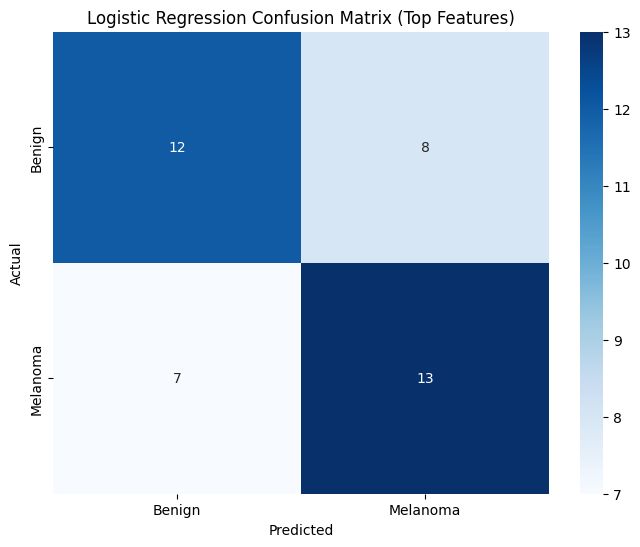

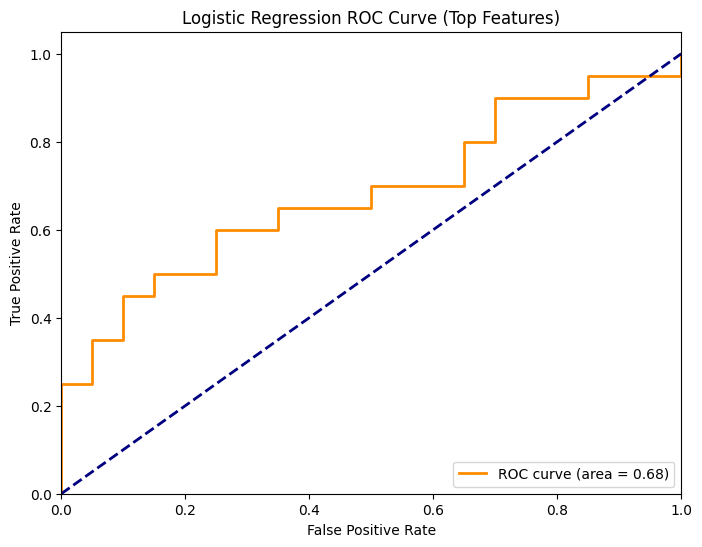


Random Forest Results (Top Features)
Confusion Matrix:
[[14  6]
 [ 8 12]]
Accuracy: 0.65
F1 Score: 0.63
AUC-ROC: 0.72
Classification Report:
              precision    recall  f1-score   support

         0.0       0.64      0.70      0.67        20
         1.0       0.67      0.60      0.63        20

    accuracy                           0.65        40
   macro avg       0.65      0.65      0.65        40
weighted avg       0.65      0.65      0.65        40



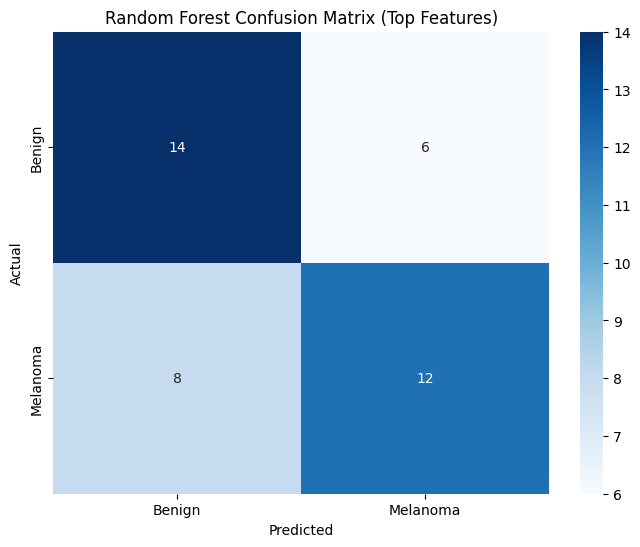

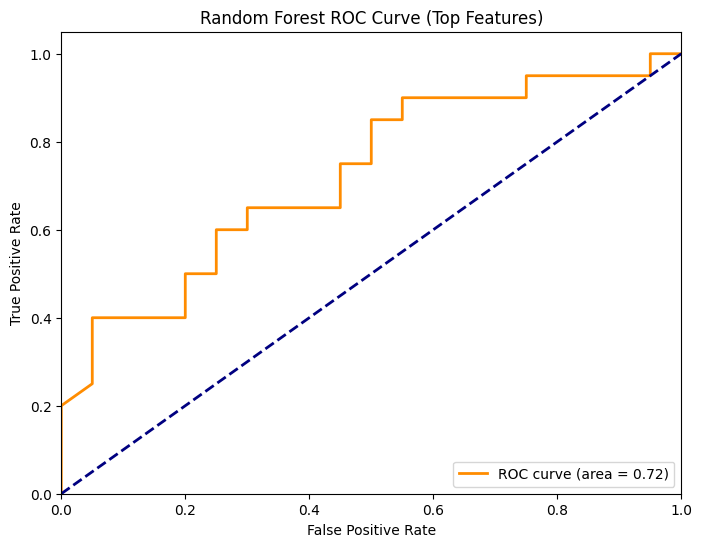


Support Vector Machine Results (Top Features)
Confusion Matrix:
[[15  5]
 [ 7 13]]
Accuracy: 0.70
F1 Score: 0.68
AUC-ROC: 0.70
Classification Report:
              precision    recall  f1-score   support

         0.0       0.68      0.75      0.71        20
         1.0       0.72      0.65      0.68        20

    accuracy                           0.70        40
   macro avg       0.70      0.70      0.70        40
weighted avg       0.70      0.70      0.70        40



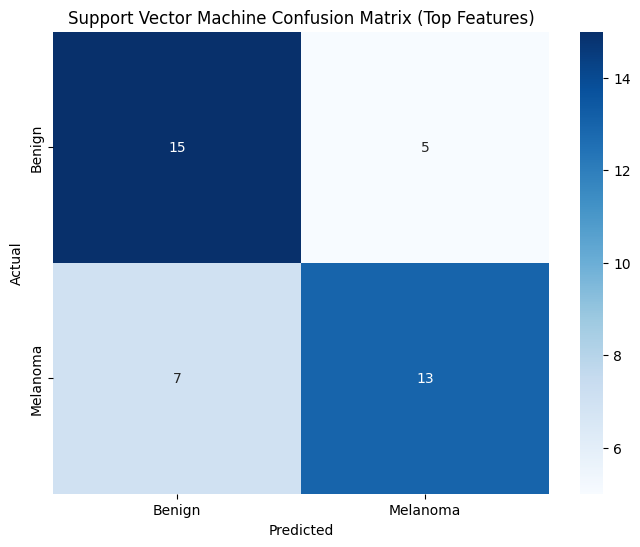

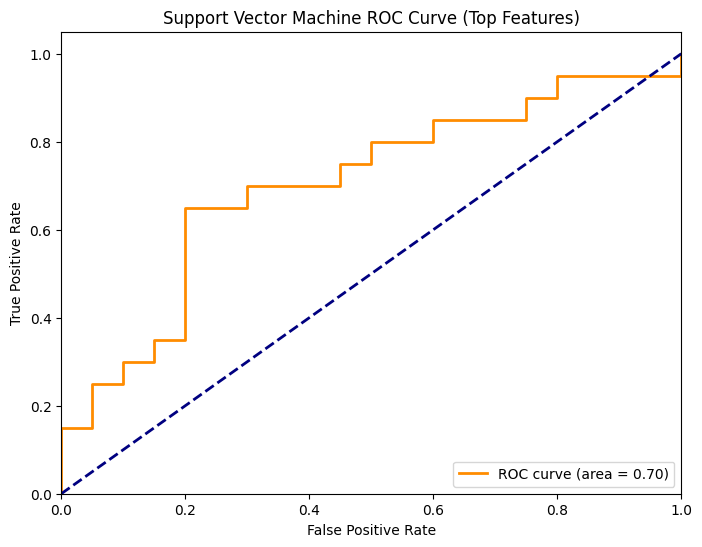


Gaussian Naive Bayes Results (Top Features)
Confusion Matrix:
[[16  4]
 [13  7]]
Accuracy: 0.57
F1 Score: 0.45
AUC-ROC: 0.65
Classification Report:
              precision    recall  f1-score   support

         0.0       0.55      0.80      0.65        20
         1.0       0.64      0.35      0.45        20

    accuracy                           0.57        40
   macro avg       0.59      0.57      0.55        40
weighted avg       0.59      0.57      0.55        40



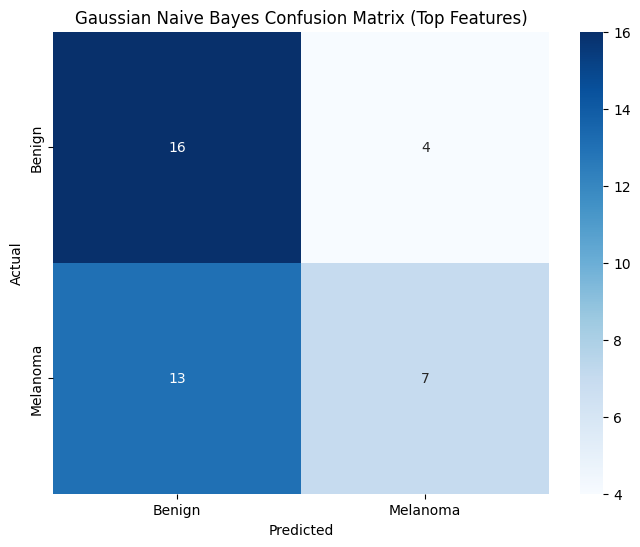

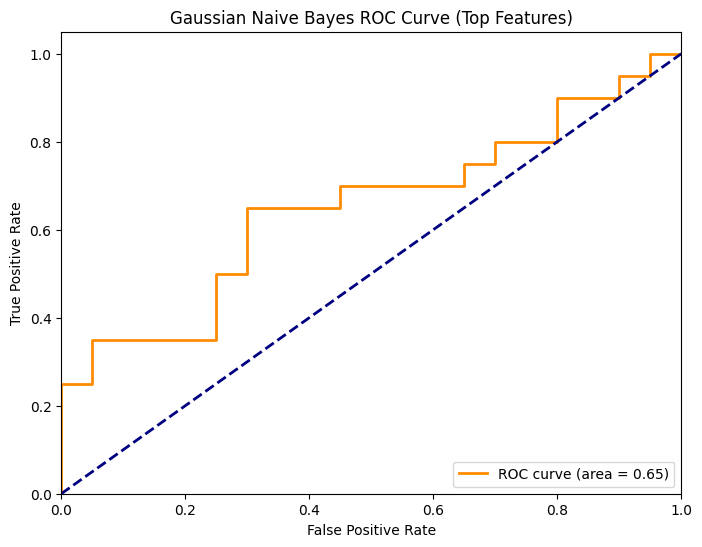


XGBoost Results (Top Features)
Confusion Matrix:
[[16  4]
 [ 7 13]]
Accuracy: 0.72
F1 Score: 0.70
AUC-ROC: 0.73
Classification Report:
              precision    recall  f1-score   support

         0.0       0.70      0.80      0.74        20
         1.0       0.76      0.65      0.70        20

    accuracy                           0.73        40
   macro avg       0.73      0.73      0.72        40
weighted avg       0.73      0.72      0.72        40



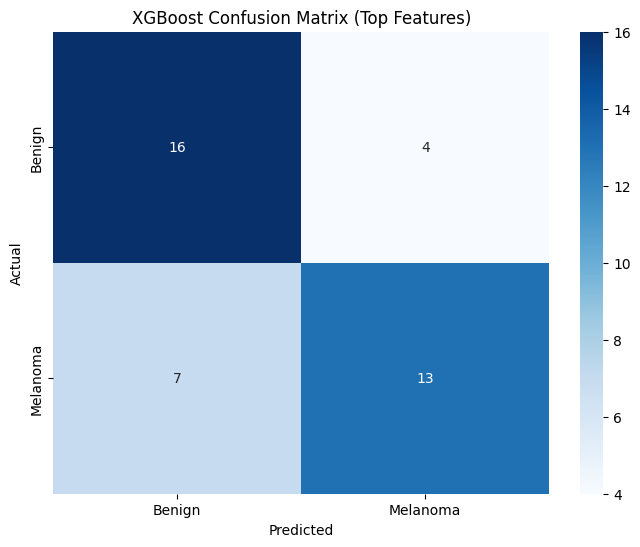

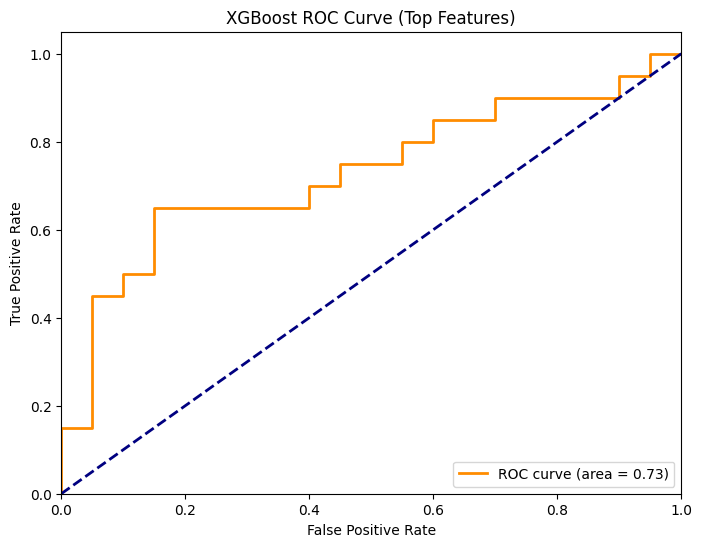

[LightGBM] [Info] Number of positive: 80, number of negative: 80
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1100
[LightGBM] [Info] Number of data points in the train set: 160, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

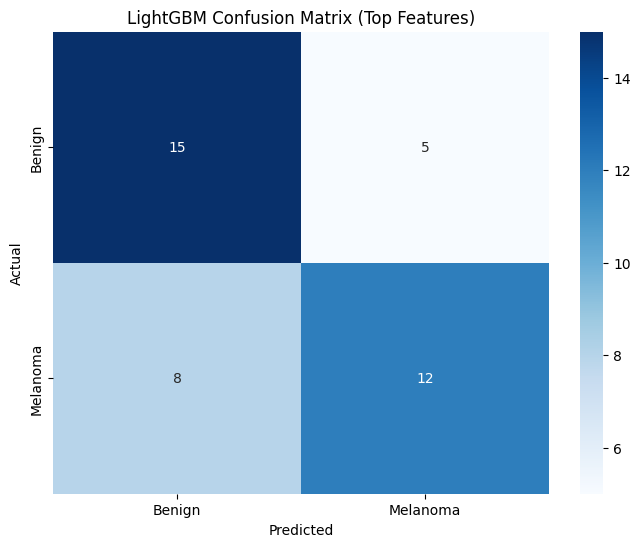

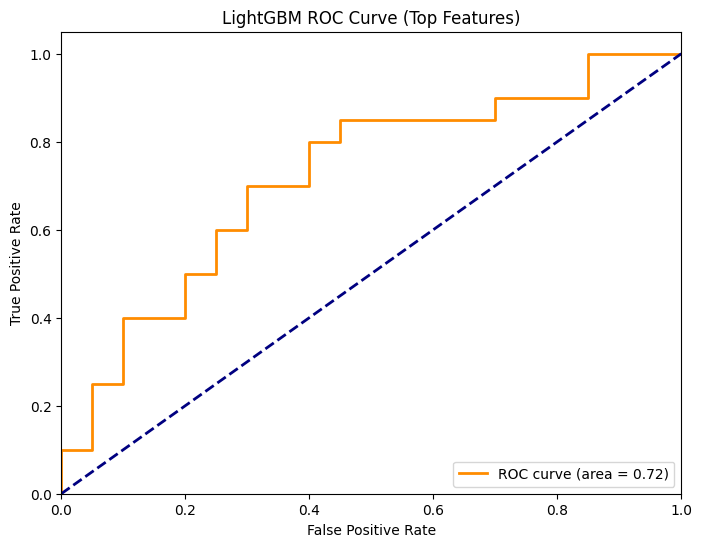

Epoch 1/200
4/4 [==============================] - 2s 112ms/step - loss: 1.9092 - accuracy: 0.4531 - val_loss: 1.8284 - val_accuracy: 0.6250
Epoch 2/200
4/4 [==============================] - 0s 29ms/step - loss: 1.8002 - accuracy: 0.5703 - val_loss: 1.7825 - val_accuracy: 0.6562
Epoch 3/200
4/4 [==============================] - 0s 28ms/step - loss: 1.7469 - accuracy: 0.5859 - val_loss: 1.7467 - val_accuracy: 0.5938
Epoch 4/200
4/4 [==============================] - 0s 26ms/step - loss: 1.6929 - accuracy: 0.6406 - val_loss: 1.7176 - val_accuracy: 0.5625
Epoch 5/200
4/4 [==============================] - 0s 25ms/step - loss: 1.6490 - accuracy: 0.6719 - val_loss: 1.6909 - val_accuracy: 0.5625
Epoch 6/200
4/4 [==============================] - 0s 25ms/step - loss: 1.6046 - accuracy: 0.6797 - val_loss: 1.6627 - val_accuracy: 0.5625
Epoch 7/200
4/4 [==============================] - 0s 24ms/step - loss: 1.5218 - accuracy: 0.6797 - val_loss: 1.6348 - val_accuracy: 0.5625
Epoch 8/200
4/4 [==

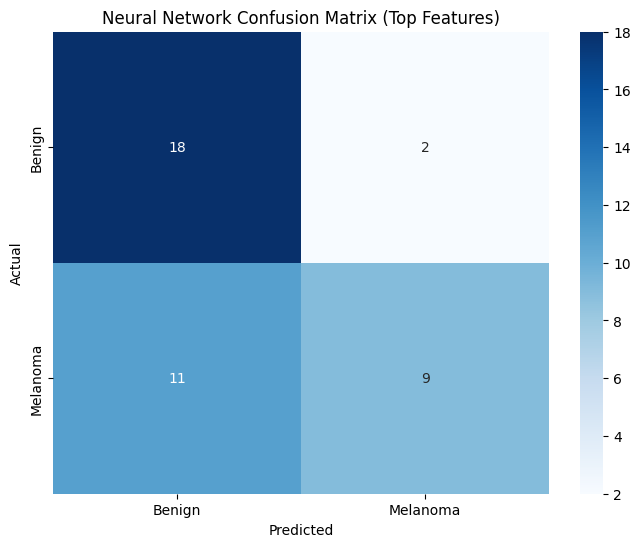

2/2 [==============================] - 0s 5ms/step


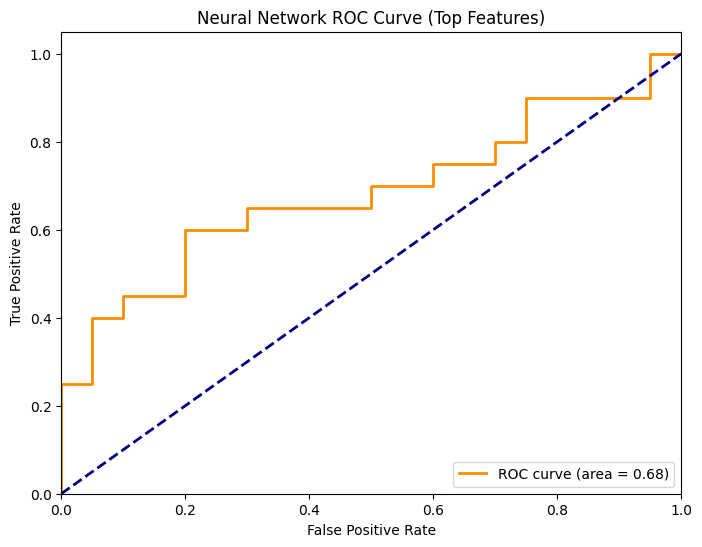

In [ ]:
# Define the top features
top_features = [
    'color_hist_v_super_59', 'color_hist_h_orig_60', 'color_hist_s_super_59',
    'color_hist_h_super_59', 'color_hist_s_orig_60', 'color_hist_v_orig_60',
    'color_hist_v_orig_59', 'color_hist_h_super_60', 'color_hist_h_orig_115',
    'lbp_hist_super_0', 'color_hist_v_super_115', 'color_hist_h_super_57',
    'color_hist_s_orig_59', 'color_hist_s_super_60', 'color_hist_v_super_60',
    'color_hist_s_orig_115', 'color_hist_v_orig_115', 'color_hist_s_orig_61',
    'color_hist_s_orig_58', 'color_hist_h_orig_59'
]

# Split the dataset into features and target using only the top features
X_top = numeric_df[top_features]
y_top = numeric_df['melanoma']

# Standardize the features
scaler = StandardScaler()
X_top = scaler.fit_transform(X_top)

# Split the data into training and testing sets with stratification
X_train_top, X_test_top, y_train_top, y_test_top = train_test_split(X_top, y_top, test_size=0.2, random_state=42, stratify=y_top)

# Print the number of samples in training and testing sets
print(f'Number of training samples: {len(X_train_top)}')
print(f'Number of test samples: {len(X_test_top)}')

# Train and evaluate different classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, penalty='l2', C=0.01),
    'Random Forest': RandomForestClassifier(n_estimators=100, max_depth=10),
    'Support Vector Machine': SVC(C=1.0, kernel='linear', probability=True),
    'Gaussian Naive Bayes': GaussianNB(),
    'XGBoost': xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
    'LightGBM': lgb.LGBMClassifier()
}

results_top = []

for name, clf in classifiers.items():
    clf.fit(X_train_top, y_train_top)
    y_pred = clf.predict(X_test_top)
    y_pred_prob = clf.predict_proba(X_test_top)[:, 1] if hasattr(clf, "predict_proba") else None
    accuracy = accuracy_score(y_test_top, y_pred)
    f1 = f1_score(y_test_top, y_pred)
    roc_auc = auc(*roc_curve(y_test_top, y_pred_prob)[:2]) if y_pred_prob is not None else None
    results_top.append({
        'Model': name,
        'Accuracy': accuracy,
        'F1 Score': f1,
        'AUC-ROC': roc_auc,
        'Precision': classification_report(y_test_top, y_pred, output_dict=True)['weighted avg']['precision'],
        'Recall': classification_report(y_test_top, y_pred, output_dict=True)['weighted avg']['recall']
    })
    print(f'\n{name} Results (Top Features)')
    print('Confusion Matrix:')
    print(confusion_matrix(y_test_top, y_pred))
    print(f'Accuracy: {accuracy:.2f}')
    print(f'F1 Score: {f1:.2f}')
    print(f'AUC-ROC: {roc_auc:.2f}' if roc_auc is not None else 'AUC-ROC: N/A')
    print('Classification Report:')
    print(classification_report(y_test_top, y_pred))
    plot_confusion_matrix(y_test_top, y_pred, title=f'{name} Confusion Matrix (Top Features)')
    if y_pred_prob is not None:
        plot_roc_curve(y_test_top, y_pred_prob, title=f'{name} ROC Curve (Top Features)')

# Define a neural network model for the top features
def create_model(input_dim):
    model = Sequential([
        Dense(128, activation='relu', input_dim=input_dim, kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    return model

# Create and compile the model
input_dim_top = X_train_top.shape[1]
model_top = create_model(input_dim_top)
model_top.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history_top = model_top.fit(X_train_top, y_train_top, epochs=200, batch_size=32, validation_split=0.2, callbacks=[early_stopping])
# Evaluate the model
y_pred_nn_top = (model_top.predict(X_test_top) > 0.5).astype("int32")
accuracy_nn_top = accuracy_score(y_test_top, y_pred_nn_top)
f1_nn_top = f1_score(y_test_top, y_pred_nn_top)
print('\nNeural Network Results (Top Features)')
print('Confusion Matrix:')
print(confusion_matrix(y_test_top, y_pred_nn_top))
print(f'Accuracy: {accuracy_nn_top:.2f}')
print(f'F1 Score: {f1_nn_top:.2f}')
print('Classification Report:')
print(classification_report(y_test_top, y_pred_nn_top))
plot_confusion_matrix(y_test_top, y_pred_nn_top, title='Neural Network Confusion Matrix (Top Features)')
y_pred_prob_nn_top = model_top.predict(X_test_top)
plot_roc_curve(y_test_top, y_pred_prob_nn_top, title='Neural Network ROC Curve (Top Features)')

# Append the neural network results to the top features results
roc_auc_nn_top = auc(*roc_curve(y_test_top, y_pred_prob_nn_top)[:2])
results_top.append({
    'Model': 'Neural Network (Top Features)',
    'Accuracy': accuracy_nn_top,
    'F1 Score': f1_nn_top,
    'AUC-ROC': roc_auc_nn_top,
    'Precision': classification_report(y_test_top, y_pred_nn_top, output_dict=True)['weighted avg']['precision'],
    'Recall': classification_report(y_test_top, y_pred_nn_top, output_dict=True)['weighted avg']['recall']
})

# Create a DataFrame to display the top features results
results_top_df = pd.DataFrame(results_top)

In [ ]:
results_top_df

,Model,Accuracy,F1 Score,AUC-ROC,Precision,Recall
0,Logistic Regression,0.625,0.634146,0.68250,0.625313,0.625
1,Random Forest,0.650,0.631579,0.72375,0.651515,0.650
2,Support Vector Machine,0.700,0.684211,0.70250,0.702020,0.700
3,Gaussian Naive Bayes,0.575,0.451613,0.65000,0.594044,0.575
4,XGBoost,0.725,0.702703,0.73000,0.730179,0.725
5,LightGBM,0.675,0.648649,0.72000,0.679028,0.675
6,Neural Network (Top Features),0.675,0.580645,0.68250,0.719436,0.675


#Conclusion

For the full feature set, **Logistic Regression** showed the best performance with an accuracy of 0.775 and an AUC-ROC of 0.8475, indicating a good balance between precision and recall. Random Forest and Support Vector Machine (SVM) also performed well, with accuracies of 0.725 and 0.750, respectively. LightGBM had similar performance to SVM. The neural network performed the worst, likely due to overfitting or inefficiency in handling the full feature set, with an accuracy of 0.625.

When using only the top features, **XGBoost** achieved the highest accuracy of 0.725 and balanced performance metrics. SVM followed with an accuracy of 0.700. Logistic Regression and Random Forest had moderate performance, while Gaussian Naive Bayes showed the lowest accuracy of 0.575. The neural network improved with the top features but still had a lower F1 score compared to other models.

Overall, feature selection improved the performance of some models, particularly XGBoost and SVM. Further improvements can be achieved through hyperparameter tuning, feature engineering, and potentially combining multiple models.

#### Note:

I experimented with data augmentation in a separate notebook, but the results did not significantly improve. My hypothesis is that the limited improvement could be due to the inherent complexity and variability of melanoma characteristics, which might require more advanced augmentation techniques or a larger, more diverse dataset to capture the subtle differences effectively.